In [2]:
######################################################################################
########## CE 295 HW4: Forcasting Residential Electricity Power Consumption ##########
########################## Franklin Zhao (SID: 3033030808) ###########################

######################################################################################

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Default plot configurations
%matplotlib inline
sns.set()
plt.rcParams['figure.figsize'] = (16,8)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
plt.rcParams['legend.fontsize'] = 15
plt.rcParams['axes.labelsize'] = 15

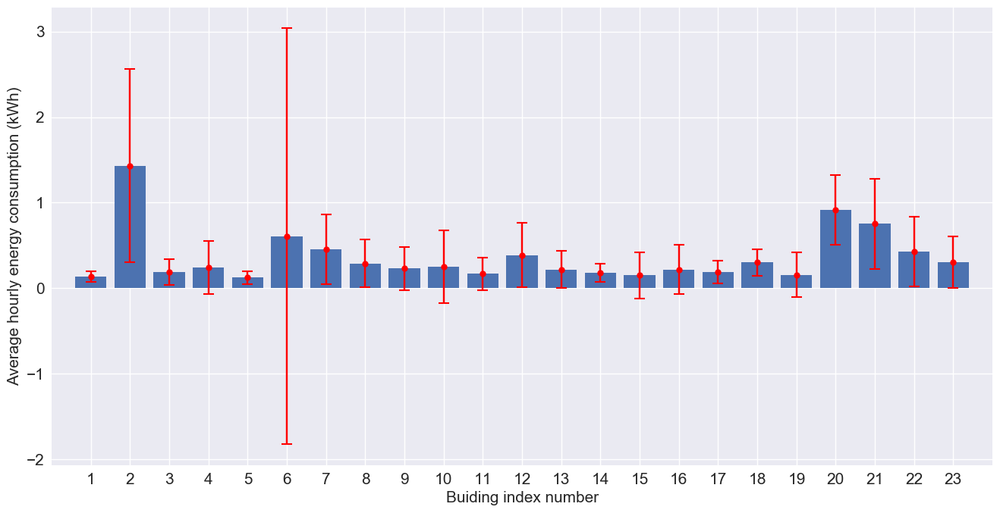

In [3]:
##### Problem 1a #####
data_train = pd.read_csv('HW4_Train_Data.csv')
bldg_id = np.arange(1,24)
bldg_avg = pd.Series(data_train.iloc[:, 3:].mean().tolist(), index=bldg_id)
bldg_std = pd.Series(data_train.iloc[:, 3:].std().tolist(), index=bldg_id)
plt.bar(bldg_id, bldg_avg)
(_, caps, _) = plt.errorbar(bldg_id, bldg_avg, yerr=bldg_std, fmt='.', ms=12, c='r', capsize=5)
for cap in caps:
    cap.set_markeredgewidth(1.5)
plt.xticks(bldg_id)
plt.xlim([0, 24])
plt.xlabel('Buiding index number')
plt.ylabel('Average hourly energy consumption (kWh)')
plt.show()

In [4]:
##### Problem 1b #####
bldg_info = data_train.iloc[:, 3:].T
bldg_neg = bldg_info[(bldg_info.iloc[:, :] < 0).any(1)]
bldg_neg

,0,1,2,3,4,5,6,7,8,9,...,8558,8559,8560,8561,8562,8563,8564,8565,8566,8567
Bldg6 (kWh),1.47,1.48,1.45,1.45,1.69,2.53,2.19,2.3,1.9,1.34,...,2.09,3.71,1.24,2.16,2.84,3.1,3.36,1.89,1.44,1.36


In [5]:
##### Problem 1c #####
datetime = pd.to_datetime(data_train['Start Time (GMT-0800,PST)'])
def convert_weekday(date):
    if date == 6:
        return 0
    else:
        return date + 1
def week_modify(date):
    if date == 6:
        return -1
    else:
        return -2
convert_weekday = np.vectorize(convert_weekday)
week_modify = np.vectorize(week_modify)
weekday = convert_weekday(datetime.dt.weekday)
week = datetime.dt.week + week_modify(datetime.dt.weekday)
hour = datetime.dt.hour

In [6]:
convert_data = bldg_info.T
convert_data = convert_data / convert_data.max()
convert_data['weekday'] = weekday
convert_data['week'] = week
convert_data['hour'] = hour
convert_data.drop(['Bldg6 (kWh)'], axis=1, inplace=True)
convert_data.head()

,Bldg1 (kWh),Bldg2 (kWh),Bldg3 (kWh),Bldg4 (kWh),Bldg5 (kWh),Bldg7 (kWh),Bldg8 (kWh),Bldg9 (kWh),Bldg10 (kWh),Bldg11 (kWh),...,Bldg17 (kWh),Bldg18 (kWh),Bldg19 (kWh),Bldg20 (kWh),Bldg21 (kWh),Bldg22 (kWh),Bldg23 (kWh),weekday,week,hour
0,0.234568,0.082343,0.021277,0.006536,0.393939,0.020325,0.034014,0.110032,0.013308,0.013514,...,0.058065,0.354651,0.009524,0.478873,0.922857,0.041543,0.277311,0,0,0
1,0.234568,0.070458,0.070922,0.006536,0.393939,0.040650,0.037415,0.071197,0.020913,0.013514,...,0.064516,0.447674,0.009524,0.501408,0.691429,0.035608,0.260504,0,0,1
2,0.234568,0.075552,0.056738,0.026144,0.363636,0.020325,0.037415,0.071197,0.011407,0.013514,...,0.051613,0.436047,0.009524,0.473239,0.660000,0.038576,0.131653,0,0,2
3,0.234568,0.070458,0.021277,0.006536,0.257576,0.036585,0.037415,0.071197,0.020913,0.010135,...,0.083871,0.197674,0.006349,0.478873,0.777143,0.041543,0.162465,0,0,3
4,0.234568,0.070458,0.021277,0.006536,0.272727,0.028455,0.030612,0.067961,0.011407,0.010135,...,0.103226,0.087209,0.009524,0.492958,0.197143,0.032641,0.123249,0,0,4


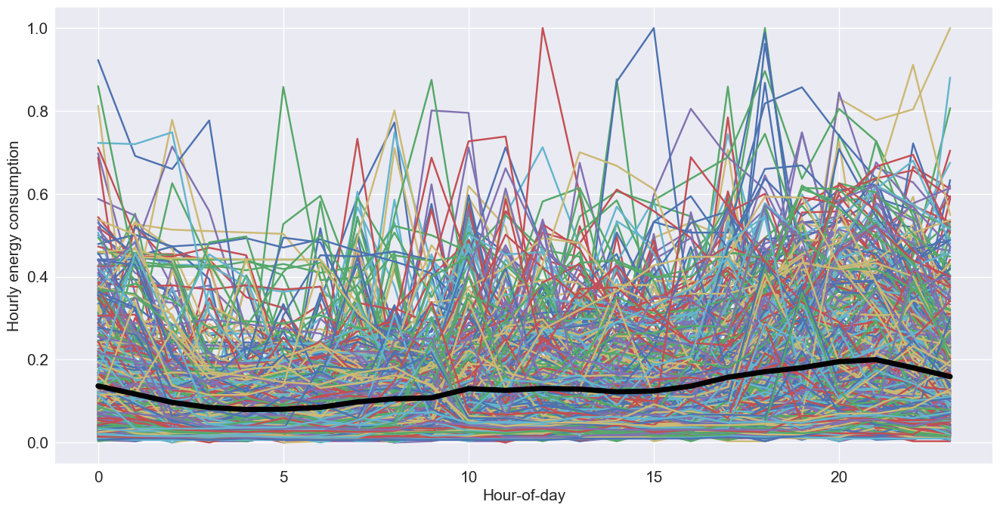

In [7]:
### Here are the seven plots ###
### The notebook would crash if I use a for loop to draw the plots ###
### So I have to hardcode 7 plots

avg = []

### Sunday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 0].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 0].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[0], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

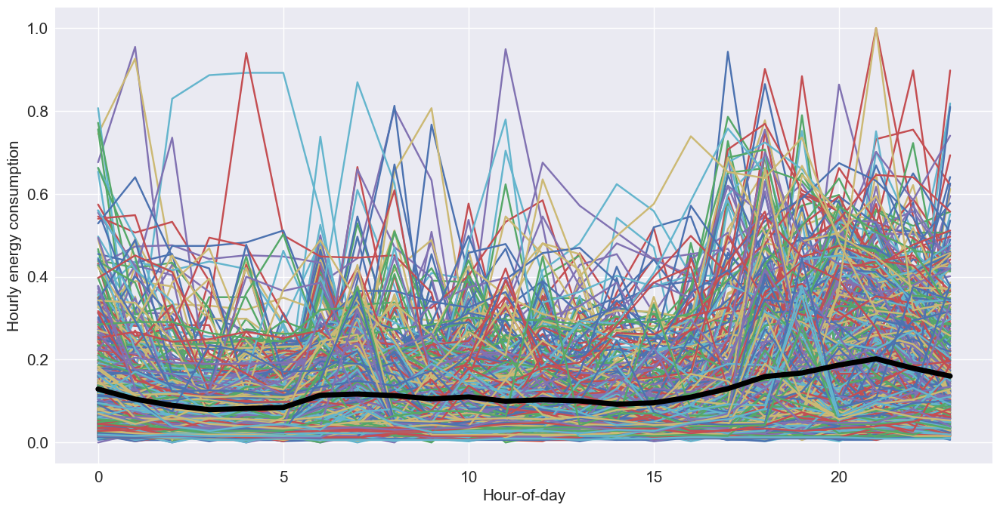

In [8]:
### Monday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 1].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 1].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[1], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

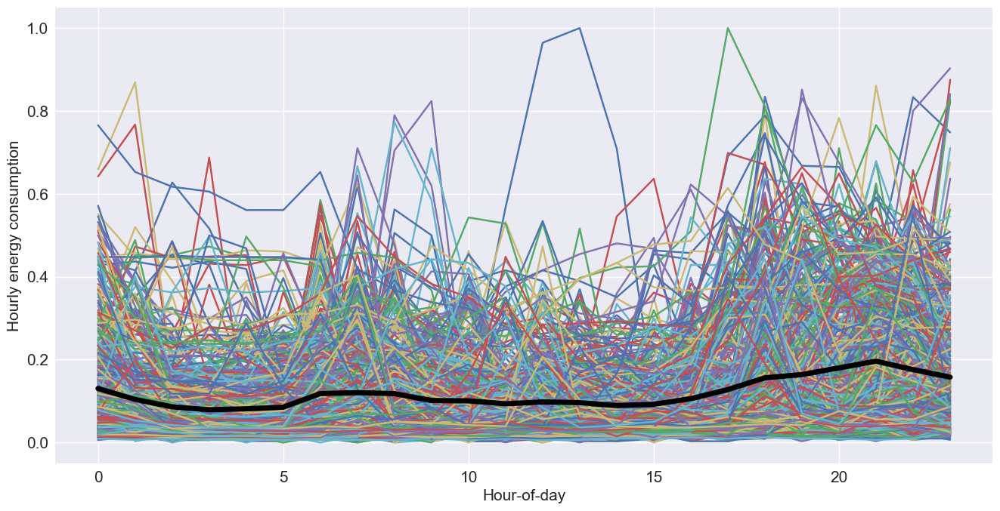

In [9]:
### Tuesday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 2].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 2].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[2], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

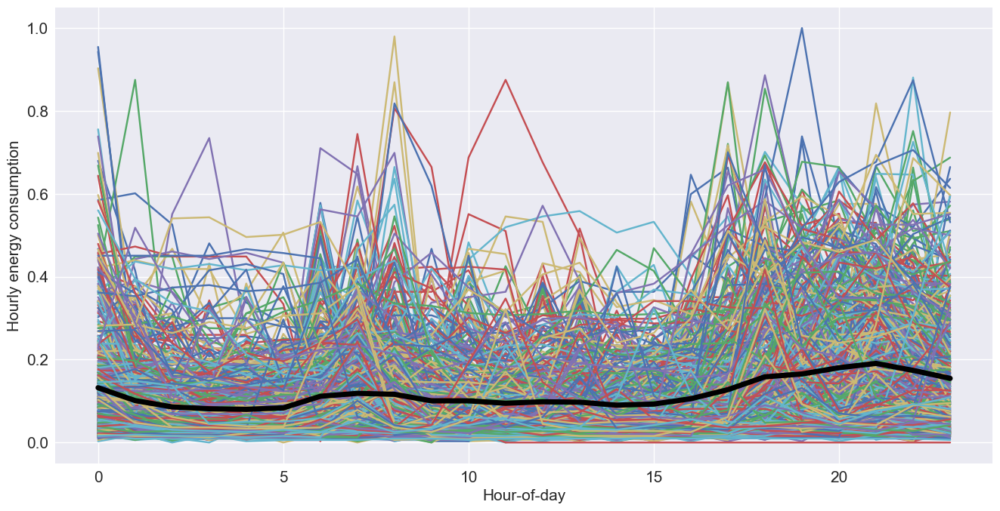

In [10]:
### Wesnesday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 3].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 3].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[3], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

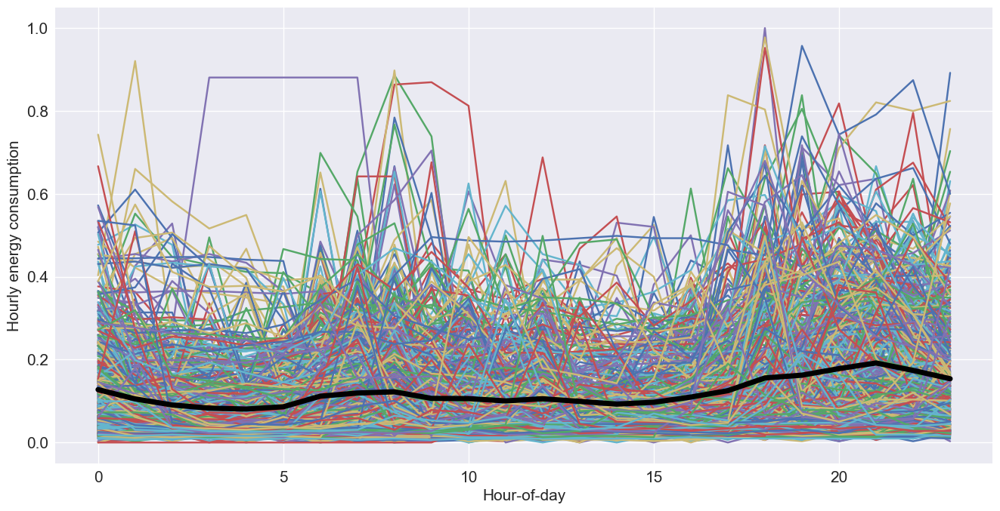

In [11]:
### Thursday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 4].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 4].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[4], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

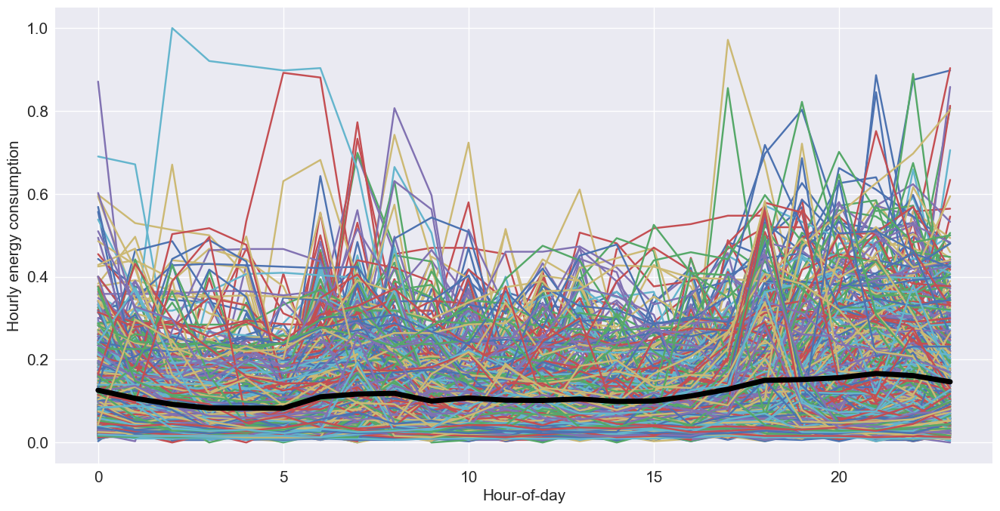

In [12]:
### Friday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 5].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 5].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[5], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

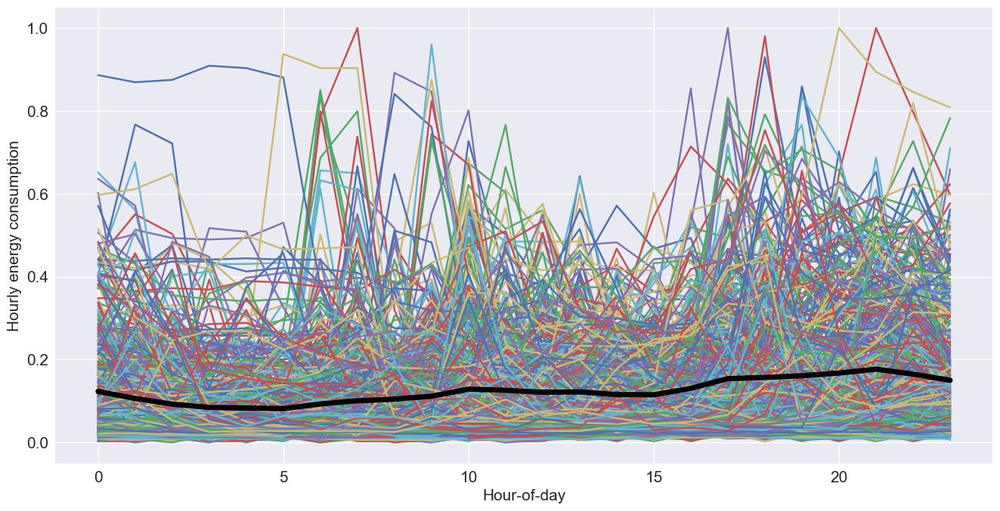

In [13]:
### Saturday ###
for i in range(22):
        data_tmp = convert_data[convert_data['weekday'] == 6].iloc[:, [i, -2, -1]]
        for j in range(24):
            data_tmp_sub = data_tmp[data_tmp['week'] == j].iloc[:, [0, -1]]
            plt.plot(data_tmp_sub.iloc[:, 1], data_tmp_sub.iloc[:, 0])
avg.append(convert_data[convert_data['weekday'] == 6].groupby('hour').mean().iloc[:, :-2].mean(axis=1))
plt.plot(np.arange(24), avg[6], c='black', lw=5)
plt.xlabel('Hour-of-day')
plt.ylabel('Hourly energy consumption')
plt.show()

In [14]:
##### Problem 2a #####
data_test = pd.read_csv('HW4_Test_Data.csv')
testtime = pd.to_datetime(data_test['TestTime'])
weekday_test = convert_weekday(testtime.dt.weekday)
hour_test = testtime.dt.hour
data_test['weekday'] = weekday_test
data_test['hour'] = hour_test
data_test['week'] = testtime.dt.week + week_modify(testtime.dt.weekday)
data_test.head()

,TestTime,TestBldg,weekday,hour,week
0,9/7/14 0:00,0.094276,0,0,35
1,9/7/14 1:00,0.037037,0,1,35
2,9/7/14 2:00,0.040404,0,2,35
3,9/7/14 3:00,0.037037,0,3,35
4,9/7/14 4:00,0.037037,0,4,35


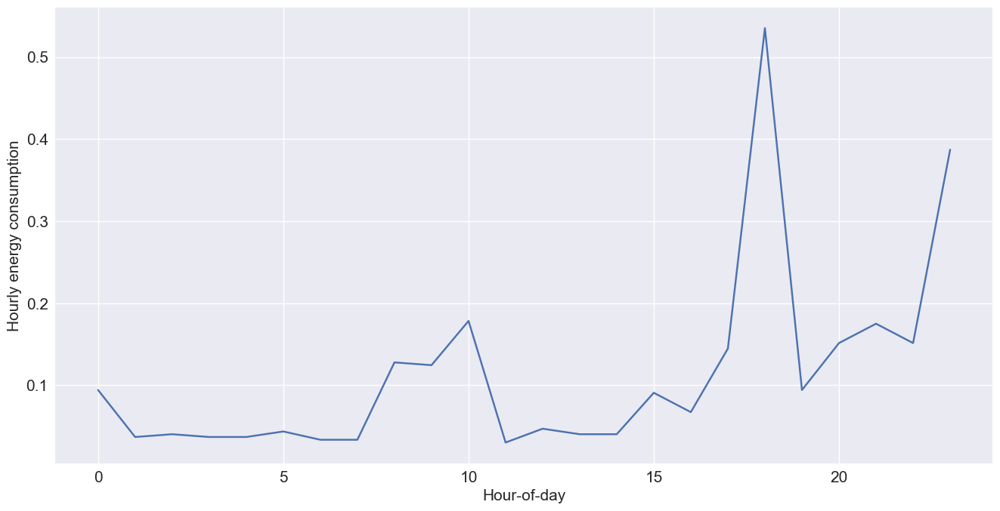

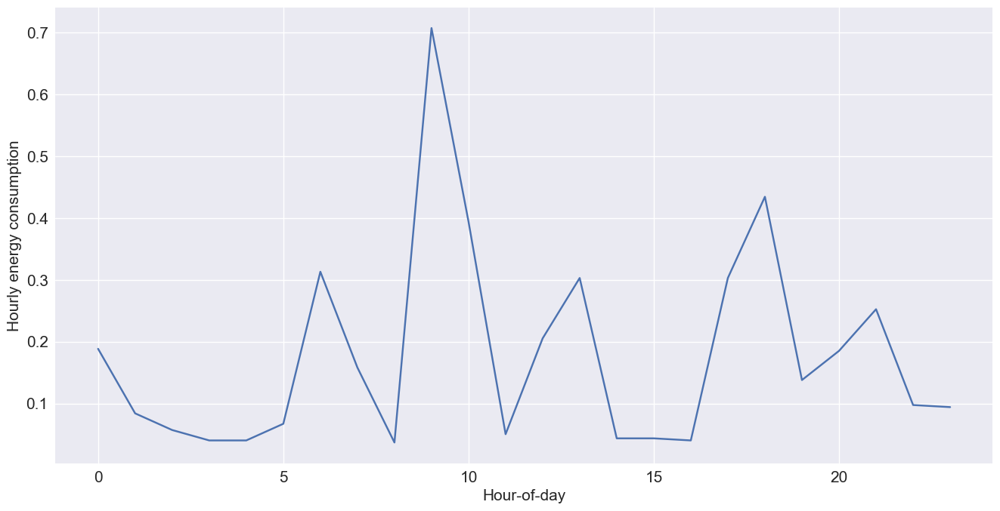

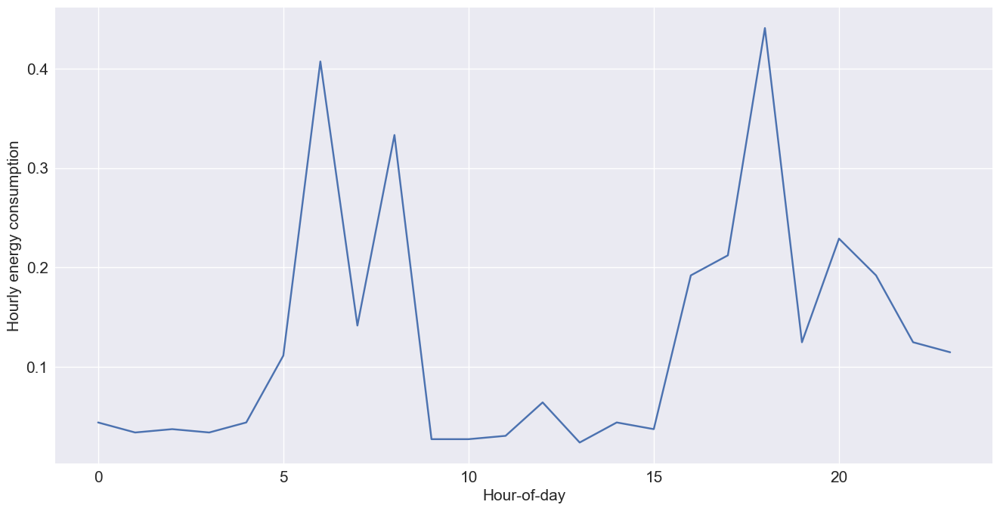

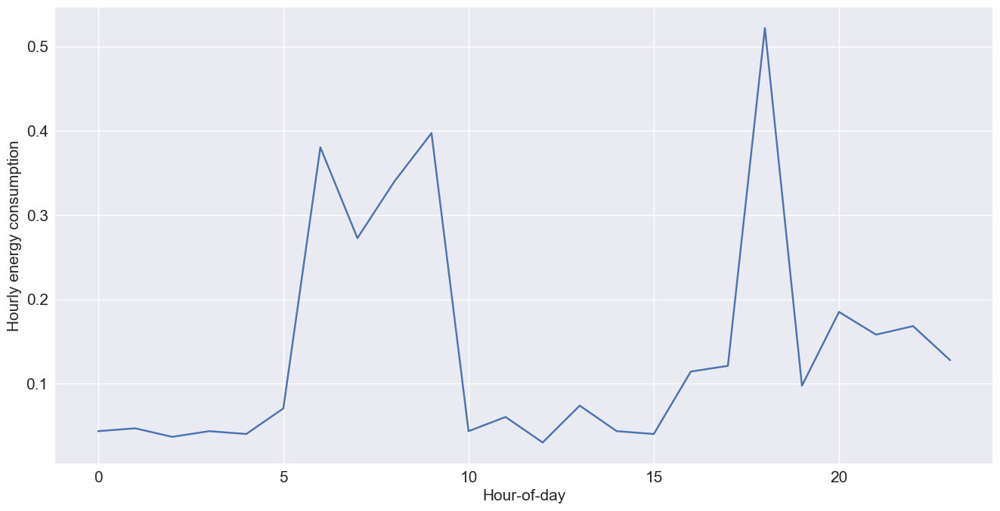

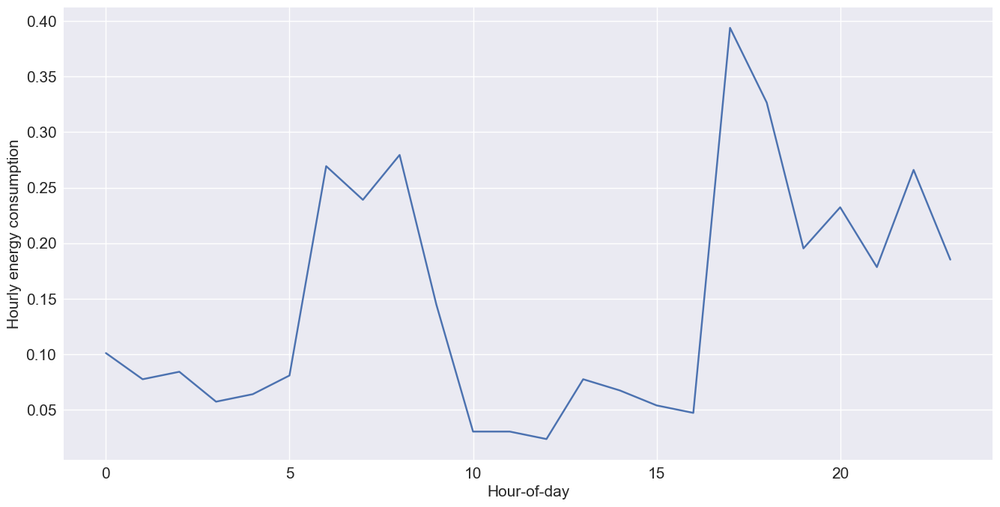

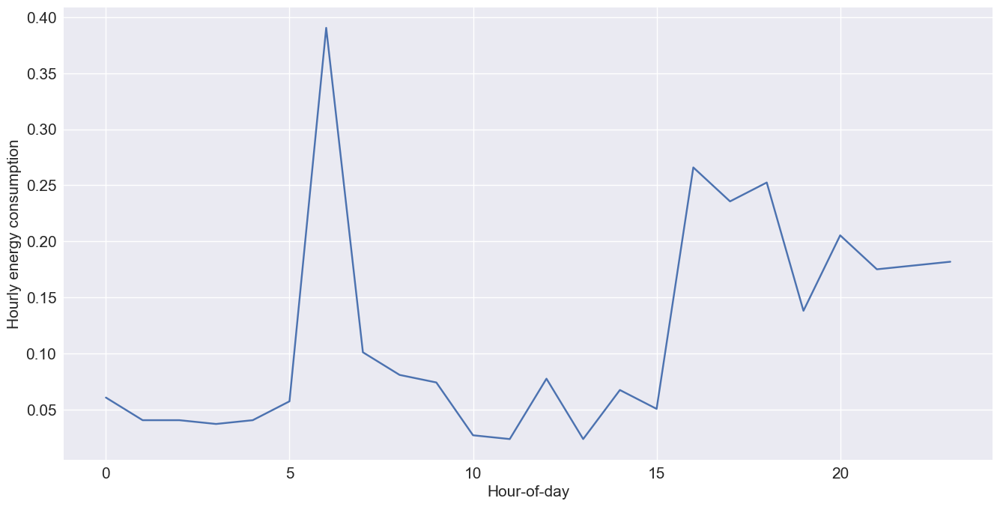

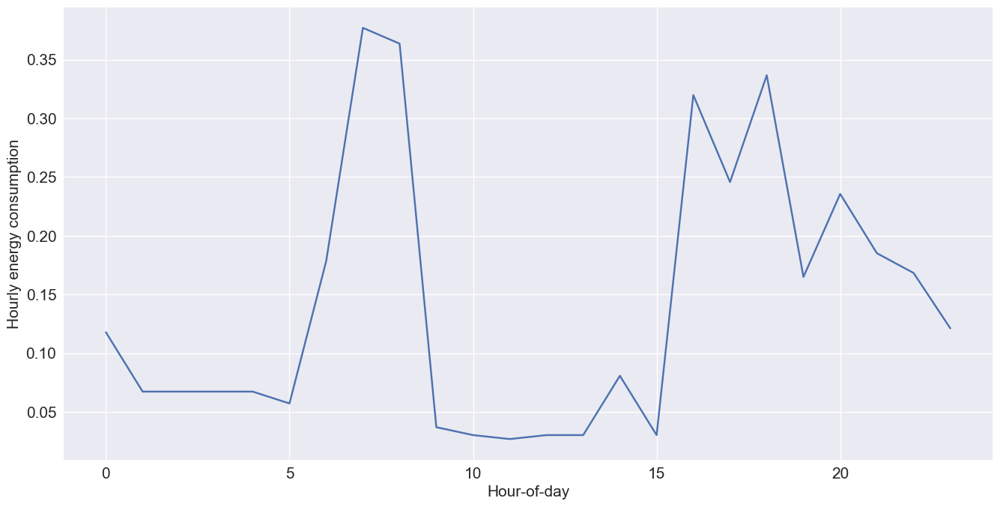

In [15]:
for i in range(7):
    data_tmp = data_test[data_test['weekday'] == i]
    plt.plot(data_tmp[['hour']], data_tmp[['TestBldg']])
    plt.xlabel('Hour-of-day')
    plt.ylabel('Hourly energy consumption')
    plt.show()

In [16]:
##### Problem 2b #####
### DoW ###
weekdays = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
MAE_Dow = []
for i in range(7):
    MAE_Dow.append(np.mean(np.abs(data_test[data_test['weekday'] == i]['TestBldg'].as_matrix() - 
                                  avg[i].as_matrix())))
MAE_Dow = pd.Series(MAE_Dow, weekdays)
print('MAE for DoW:\n', MAE_Dow, sep='')

MAE for DoW:
Sunday       0.072854
Monday       0.108930
Tuesday      0.079239
Wednesday    0.084258
Thursday     0.067724
Friday       0.062153
Saturday     0.079013
dtype: float64


In [17]:
### Entire week ###
MAE_week = np.mean(np.abs(data_test['TestBldg'].as_matrix() - np.array(avg).reshape(7 * 24)))
print('MAE for the entire week:', MAE_week)

MAE for the entire week: 0.0791671972417


In [177]:
##### Problem 3c #####
Phi = np.zeros((165, 3))
for i in range(165):
    Phi[i, :] = data_test['TestBldg'][i:i+3]
Y = data_test['TestBldg'].as_matrix()[3:] - np.array(avg).reshape(7 * 24)[3:]
Y = Y.reshape(165, 1)
theta_star = np.linalg.inv(Phi.T @ Phi) @ Phi.T @ Y
alphas = ['alpha_1^*', 'alpha_2^*', 'alpha_3^*']
theta_summary = pd.Series(theta_star.squeeze(), alphas)
print('values of alpha stars:\n', theta_summary, sep='')

values of alpha stars:
alpha_1^*   -0.064908
alpha_2^*   -0.042012
alpha_3^*    0.234507
dtype: float64


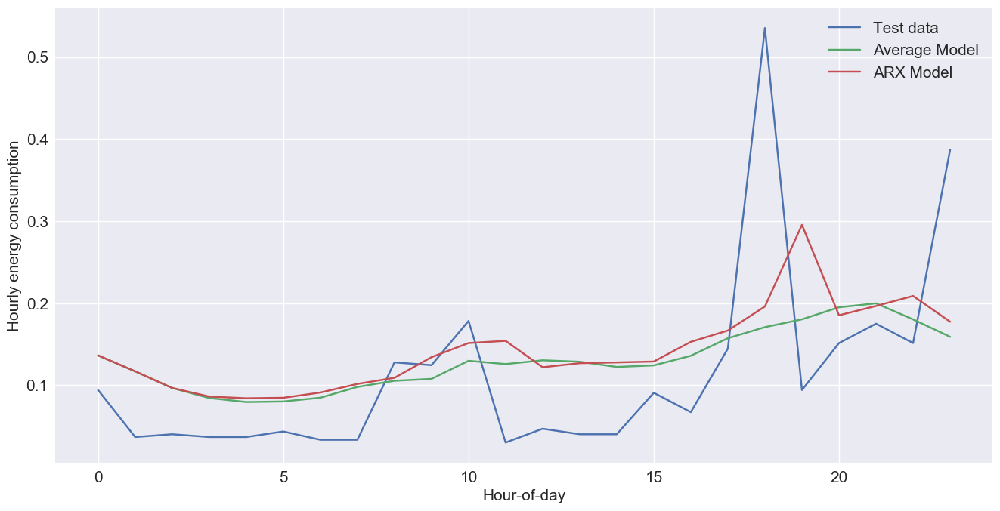

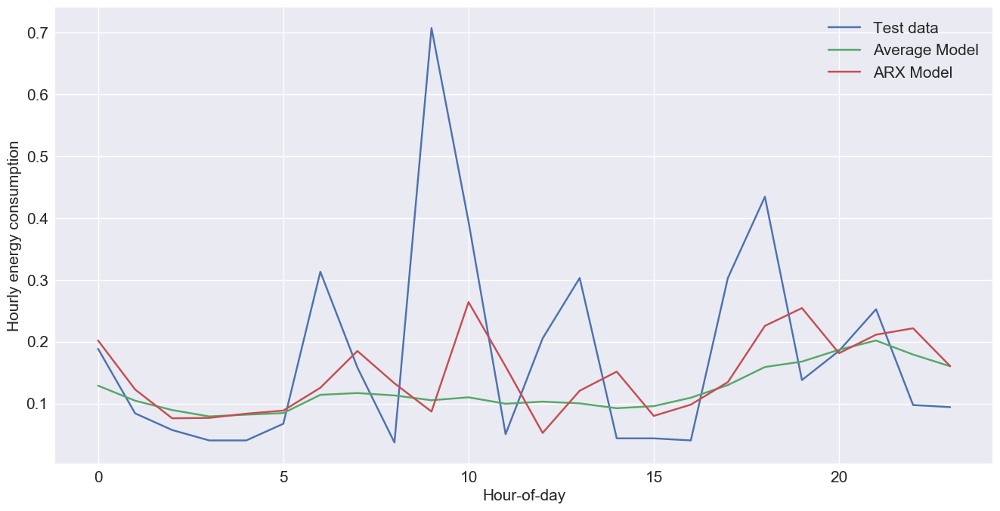

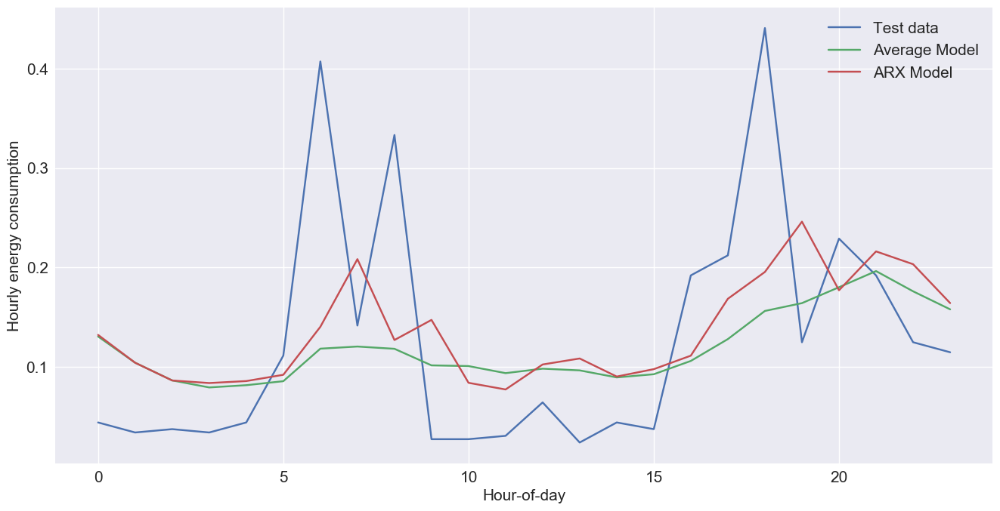

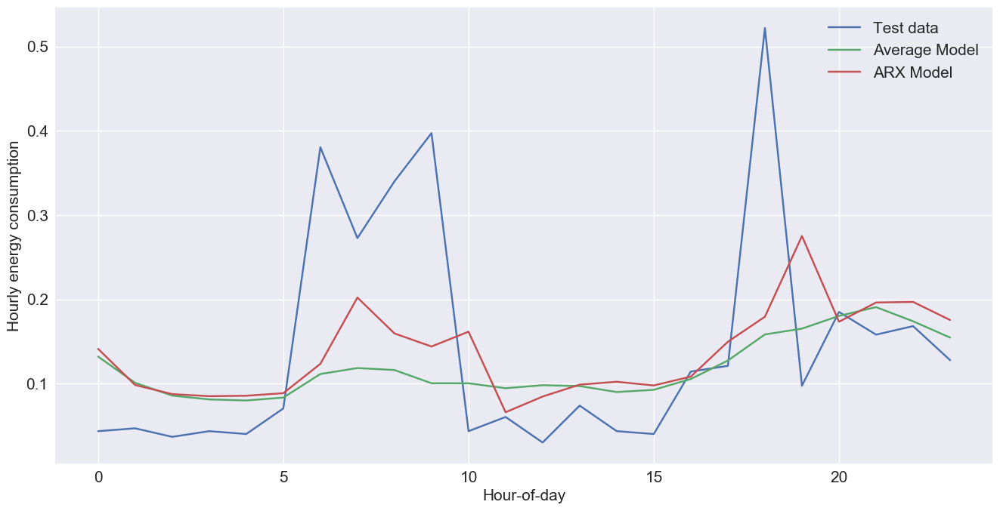

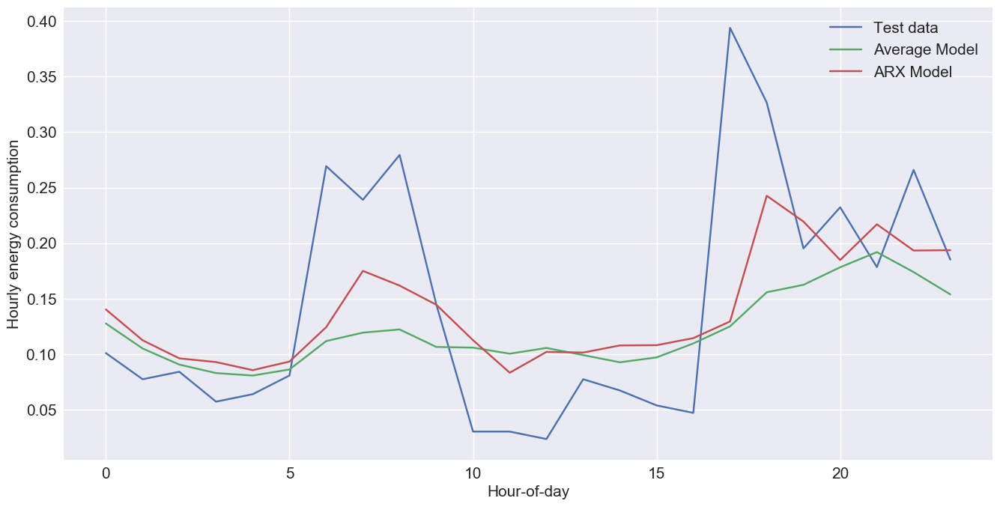

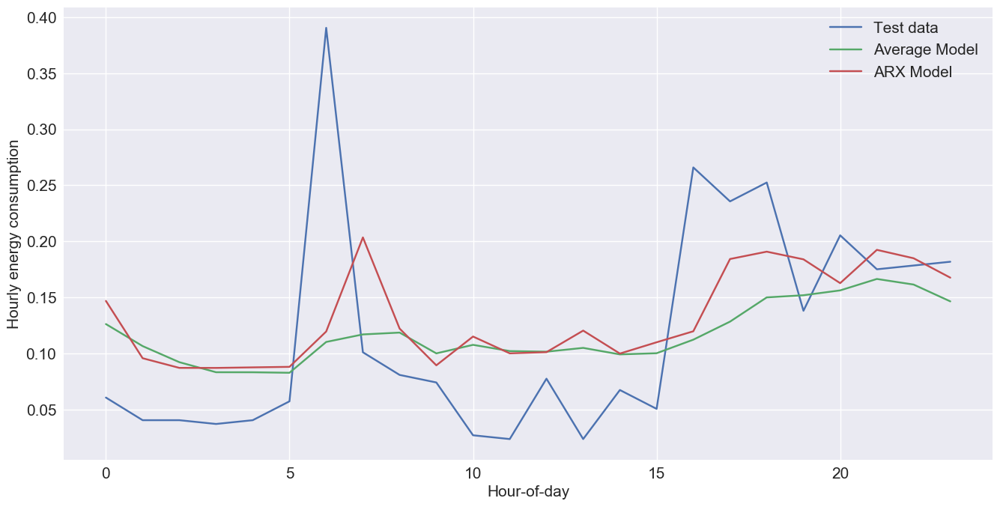

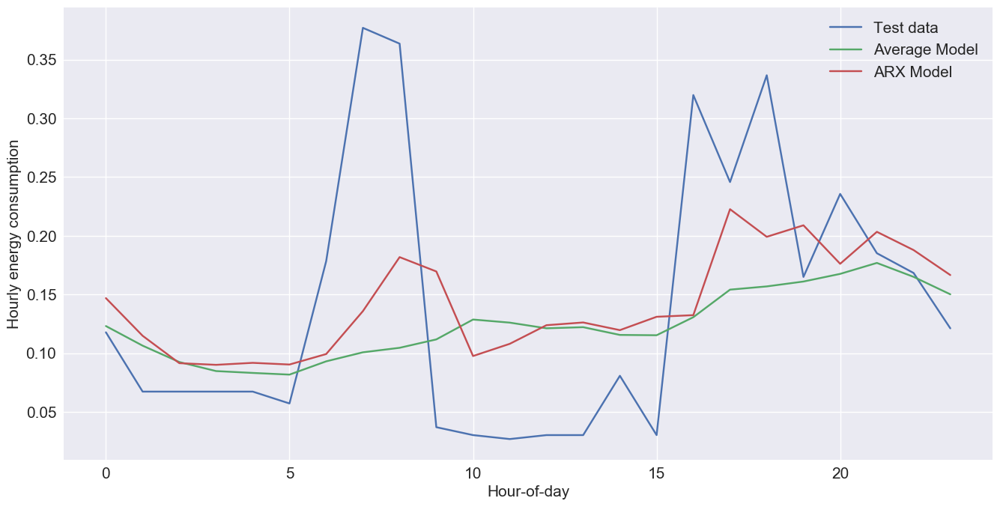

MAE for DoW:
Sunday       0.078284
Monday       0.108630
Tuesday      0.083678
Wednesday    0.086059
Thursday     0.059289
Friday       0.062893
Saturday     0.076177
dtype: float64

MAE for the entire week: 0.0792873276726


In [178]:
##### Problem 3d #####
Avg_mod = np.array(avg).reshape(7 * 24)
ARX_temp = (Phi @ theta_star).squeeze()
ARX_mod = np.insert(ARX_temp, 0, [0, 0, 0]) + Avg_mod
MAE_Avg = []

### DoW ###
week_threshold = np.arange(7*24, step=24)
for i in range(7):
    plt.plot(np.arange(24), data_test['TestBldg'].as_matrix()[week_threshold[i]:week_threshold[i]+24]
            , label='Test data')
    plt.plot(np.arange(24), Avg_mod[week_threshold[i]:week_threshold[i]+24]
            , label='Average Model')
    plt.plot(np.arange(24), ARX_mod[week_threshold[i]:week_threshold[i]+24]
            , label='ARX Model')
    plt.legend()
    plt.xlabel('Hour-of-day')
    plt.ylabel('Hourly energy consumption')
    plt.show()
    MAE_Avg.append(np.mean(np.abs(data_test['TestBldg'].as_matrix()[week_threshold[i]:week_threshold[i]+24] 
                                  - ARX_mod[week_threshold[i]:week_threshold[i]+24])))
    
MAE_Avg = pd.Series(MAE_Avg, weekdays)
print('MAE for DoW:\n', MAE_Avg, sep='')

### Entire week ###
Err = data_test['TestBldg'].as_matrix() - ARX_mod
print('\nMAE for the entire week:', np.mean(np.abs(Err)))

In [179]:
##### Problem 4c #####
y_train = Y
X_train = Phi
w = np.zeros((1, 3))
max_iter = 300
i = 0
diff = float(10)
### Here I used a decaying stepsize
step_size = lambda i: 1/(100+i)
while (i <= max_iter and diff > 1e-5):
    # Use a vectorized form to increase the efficiency !
    w_update = w + step_size(i) * (y_train - np.tanh(X_train @ w.T) ** 2).T @ (
        + np.ones((165, 1))) @ (y_train - np.tanh(X_train @ w.T)).T @ X_train
    diff = np.mean((w - w_update) ** 2)
    w = w_update
    i = i + 1
omegas = ['omega_1^*', 'omega_2^*', 'omega_3^*']
w_summary = pd.Series(w.squeeze(), omegas)
print('values of omega stars:\n', w_summary, sep='')

values of omega stars:
omega_1^*   -0.032266
omega_2^*    0.001350
omega_3^*    0.156858
dtype: float64


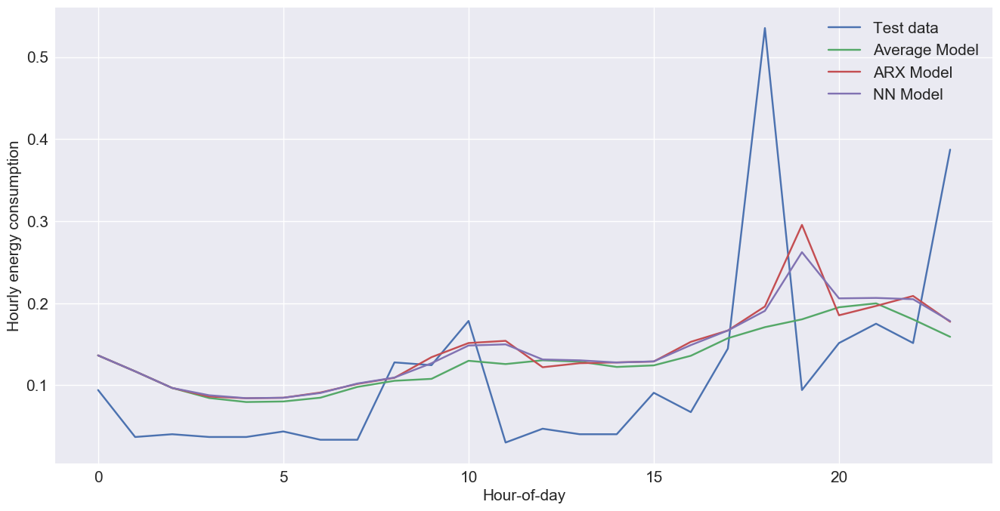

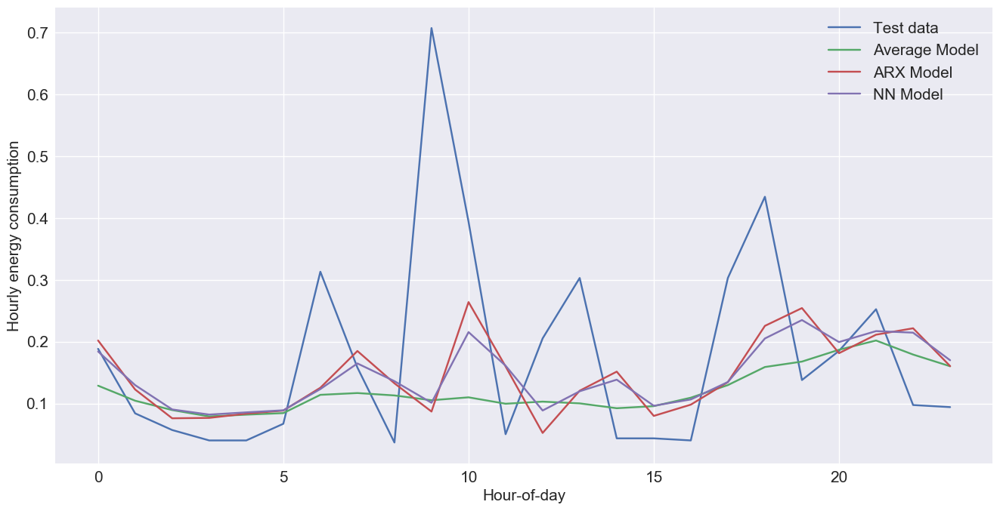

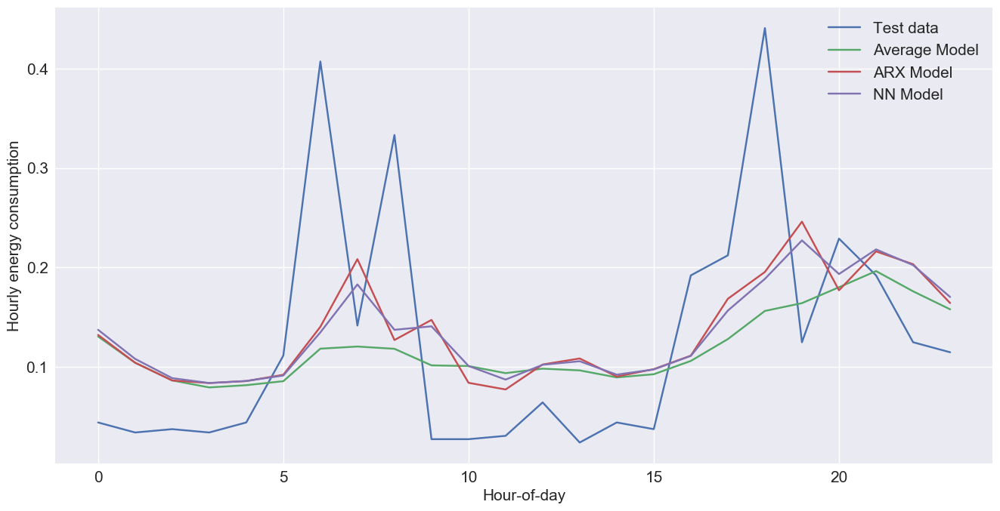

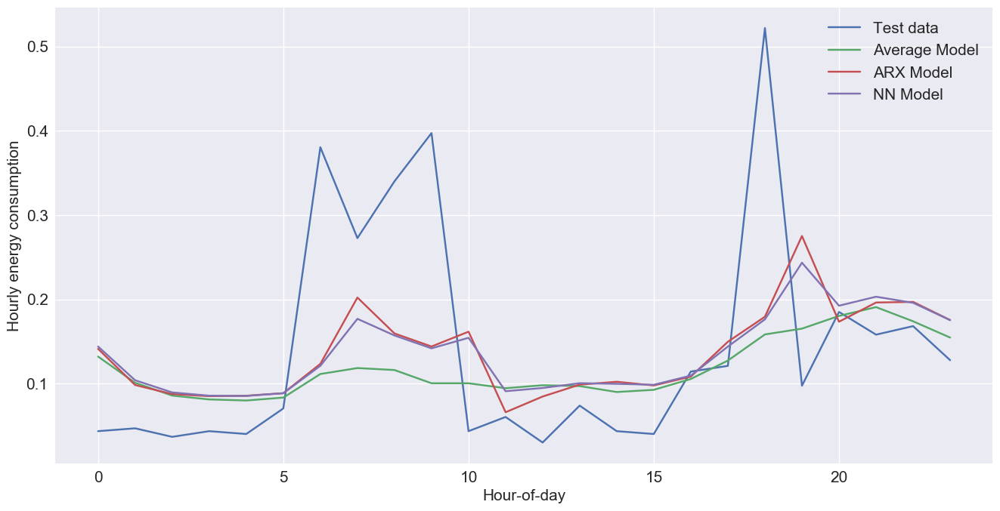

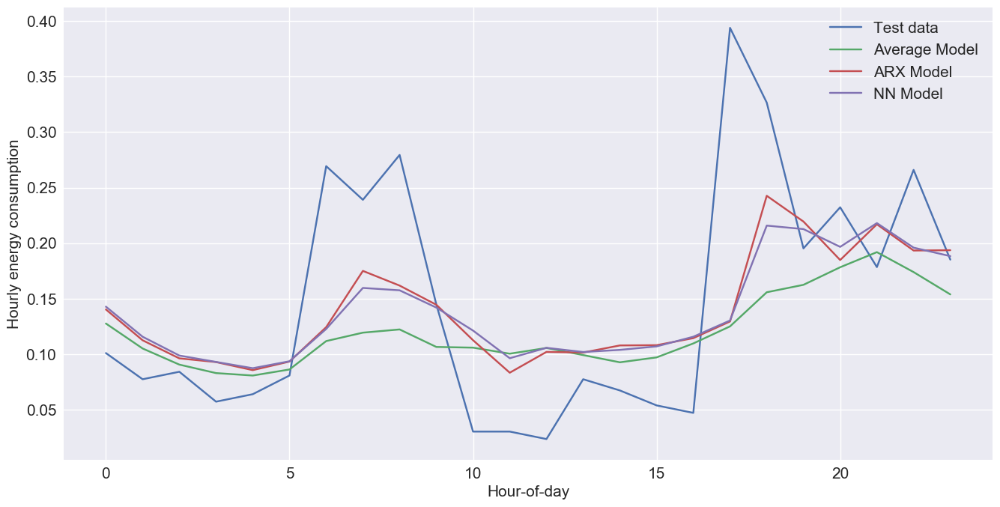

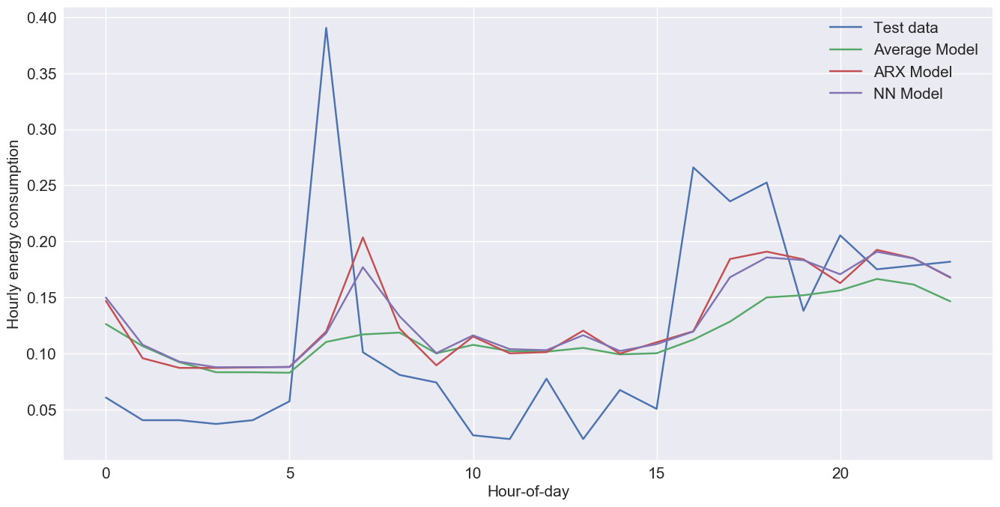

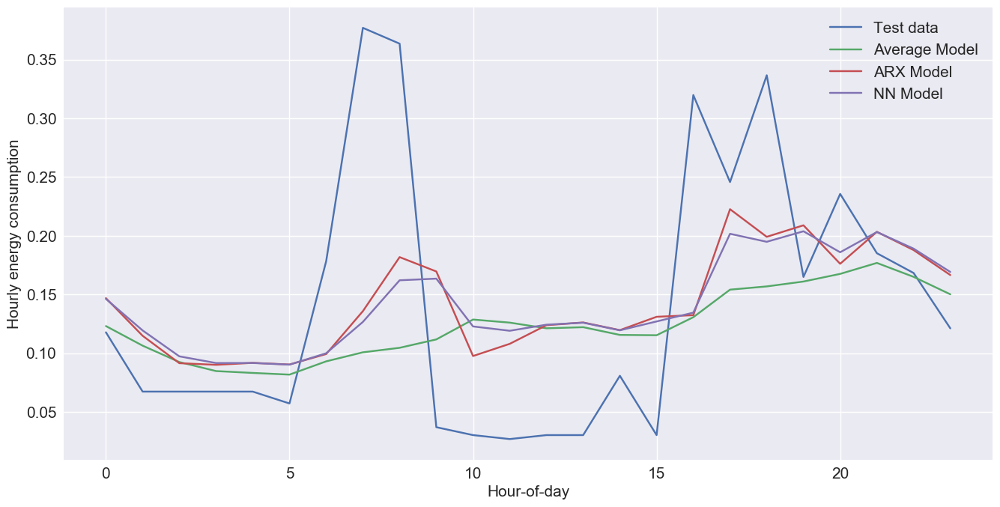

MAE for DoW:
Sunday       0.078262
Monday       0.109701
Tuesday      0.083350
Wednesday    0.087587
Thursday     0.061653
Friday       0.064206
Saturday     0.079404
dtype: float64

MAE for the entire week: 0.0805947512505


In [180]:
##### Problem 4d #####
NN_temp = np.tanh((X_train @ w.T)).squeeze()
NN_mod = np.insert(NN_temp, 0, [0, 0, 0]) + Avg_mod
MAE_NN = []

### DoW ###
for i in range(7):
    plt.plot(np.arange(24), data_test['TestBldg'].as_matrix()[week_threshold[i]:week_threshold[i]+24]
            , label='Test data')
    plt.plot(np.arange(24), Avg_mod[week_threshold[i]:week_threshold[i]+24]
            , label='Average Model')
    plt.plot(np.arange(24), ARX_mod[week_threshold[i]:week_threshold[i]+24]
            , label='ARX Model')
    plt.plot(np.arange(24), NN_mod[week_threshold[i]:week_threshold[i]+24]
            , label='NN Model')
    plt.legend()
    plt.xlabel('Hour-of-day')
    plt.ylabel('Hourly energy consumption')
    plt.show()
    MAE_NN.append(np.mean(np.abs(data_test['TestBldg'].as_matrix()[week_threshold[i]:week_threshold[i]+24] - 
                                 NN_mod[week_threshold[i]:week_threshold[i]+24])))
    
MAE_NN = pd.Series(MAE_NN, weekdays)
print('MAE for DoW:\n', MAE_NN, sep='')

### Entire week ###
Err_NN = data_test['TestBldg'].as_matrix() - NN_mod
print('\nMAE for the entire week:', np.mean(np.abs(Err_NN)))